#### Anahit Zakaryan homework 4 

In [1]:
import pandas as pd
import numpy as np
import networkx as nx
import itertools
import random
from operator import itemgetter
import matplotlib.pyplot as plt
from heapq import nlargest, nsmallest

In [2]:
import matplotlib.colors as colors
from infomap import Infomap

In [3]:
G=nx.Graph()

In [4]:
largest_number = float('-inf')
smallest_number = float('inf')

with open('connections.txt', 'r') as file:
    for line in file:
        numbers = line.strip().split()  # Split the line into numbers
        
        # Iterate over numbers in the line
        for number in numbers:
            number = float(number)  # Convert number to float
            
            # Check for largest and smallest numbers
            if number > largest_number:
                largest_number = number
            if number < smallest_number:
                smallest_number = number

# Print the largest and smallest numbers
print("Largest number:", largest_number)
print("Smallest number:", smallest_number)

Largest number: 4038.0
Smallest number: 0.0


In [5]:

G = nx.read_edgelist("connections.txt", create_using=nx.DiGraph(), nodetype=int)
# Graph with 12 nodes and 17 edges

Bridges:
(323, 332)
(323, 341)
(322, 323)
(322, 329)
(339, 340)
(339, 347)
(322, 339)
(322, 342)
(322, 345)
(290, 322)
(280, 290)
(280, 291)
(280, 297)
(308, 338)
(280, 304)
(277, 280)
(277, 285)
(277, 294)
(311, 344)
(277, 311)
(168, 277)
(158, 168)
(320, 346)
(271, 298)
(239, 295)
(158, 232)
(158, 242)
(158, 248)
(158, 317)
(142, 158)
(222, 240)
(203, 270)
(142, 161)
(142, 169)
(142, 170)
(123, 142)
(122, 123)
(557, 570)
(555, 557)
(553, 555)
(561, 565)
(679, 682)
(678, 679)
(678, 685)
(639, 678)
(637, 639)
(651, 683)
(1888, 1891)
(1902, 1911)
(1898, 1902)
(1888, 1898)
(1879, 1888)
(1864, 1879)
(1845, 1864)
(1843, 1845)
(1842, 1843)
(1842, 1849)
(1842, 1861)
(1868, 1900)
(1842, 1868)
(1839, 1842)
(1839, 1886)
(1839, 1909)
(1826, 1839)
(1816, 1826)
(1835, 1851)
(1881, 1882)
(1897, 1910)
(1885, 1897)
(1881, 1885)
(1867, 1881)
(1835, 1883)
(1816, 1827)
(1810, 1816)
(1810, 1823)
(1809, 1810)
(1809, 1813)
(1809, 1832)
(1804, 1809)
(1804, 1811)
(1804, 1863)
(1800, 1804)
(1800, 1819)
(1800,

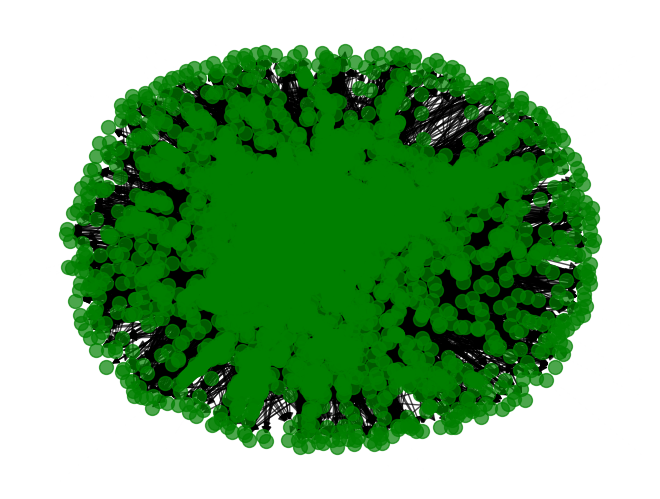

In [6]:
import networkx as nx
import matplotlib.pyplot as plt

def find_bridges(graph):
    bridges = []
    visited = set()
    disc = {}
    low = {}
    parent = {}

    for node in graph:
        disc[node] = float('inf')  # Initialize discovery time with infinity
        low[node] = float('inf')   # Initialize low value with infinity
        parent[node] = None        # Initialize parent as None

    def dfs(u):
        visited.add(u)
        disc[u] = dfs.time
        low[u] = dfs.time
        dfs.time += 1

        for v in graph[u]:
            if v not in visited:
                parent[v] = u
                dfs(v)

                low[u] = min(low[u], low[v])

                if low[v] > disc[u]:
                    bridges.append((u, v))

            elif v != parent[u]:
                low[u] = min(low[u], disc[v])

    dfs.time = 0

    for node in graph:
        if node not in visited:
            dfs(node)

    return bridges

# Read the graph from the edgelist file
G = nx.read_edgelist("connections.txt", create_using=nx.DiGraph(), nodetype=int)

# Draw the graph
nx.draw(G, with_labels=False, node_color='g',node_size=100, alpha=0.7)

# Find the bridges
bridges = find_bridges(G)

# Display the bridges (nodes that are bridges)
print("Bridges:")
for bridge in bridges:
    print(bridge)

plt.show()


In [8]:
len(bridges)

1449

In [9]:
betweenness = nx.betweenness_centrality(G)
bridges = nlargest(15, betweenness, key=betweenness.get)
for i in bridges:
    print(f'Node {i}: Betweenness {betweenness[i]}')

Node 1684: Betweenness 0.03299985344063623
Node 1912: Betweenness 0.027145672353148857
Node 1718: Betweenness 0.026577614223444346
Node 563: Betweenness 0.01300961569074186
Node 1405: Betweenness 0.010123670299605515
Node 1656: Betweenness 0.009425937129610911
Node 1086: Betweenness 0.008553563518788857
Node 567: Betweenness 0.008300375906658487
Node 3437: Betweenness 0.008194350620311139
Node 119: Betweenness 0.006358997369476009
Node 1435: Betweenness 0.005411020189789544
Node 526: Betweenness 0.005301465796260494
Node 1621: Betweenness 0.0048429568781480315
Node 173: Betweenness 0.0048358807566961605
Node 1561: Betweenness 0.004750572119721505
Node 1376: Betweenness 0.004516894103812997
Node 1666: Betweenness 0.004499661887491212
Node 1334: Betweenness 0.00441478425428826
Node 1559: Betweenness 0.00410018375278715
Node 1663: Betweenness 0.003944074440322393
Node 1171: Betweenness 0.0038891585665979905
Node 163: Betweenness 0.0036885815222565885
Node 641: Betweenness 0.00346106538285

In [6]:
vertices= G.number_of_nodes()
edges= G.number_of_edges()
density = (edges) / (vertices * (vertices - 1))
density

0.0054099817517196435

In [7]:
edges

88234

In [27]:
print(f"Graph Density: {(nx.density(G))}")

Graph Density: 0.0054099817517196435


A **density** value that is near to _0_ indicates that the graph has fewer edges than the total number of edges that may be present. This suggests that there are __significantly fewer connections__ between the vertices and that the graph is **not densely linked**.

---------------------

In [30]:
degrees = dict(G.degree())
# Find the node with the highest degree
node_with_max_degree = max(degrees, key=degrees.get)
print(f" node with the highest degree {node_with_max_degree}")
# Find the node with the lowest degree
node_with_min_degree = min(degrees, key=degrees.get)
print(f" node with the lowest degree {node_with_min_degree}")

 node with the highest degree 107
 node with the lowest degree 11


In [17]:
highest_degree_node = max(G.nodes, key=G.degree) 
d=G.degree(highest_degree_node)
print("Node: {} {}Degree: {}".format(highest_degree_node,'\n',d))

Node: 107 
Degree: 1045


In [32]:
lowest_degree_node = min(G.nodes, key=G.degree) 
d=G.degree(lowest_degree_node)
print("Node: {} {}Degree: {}".format(lowest_degree_node,'\n',d))

Node: 11 
Degree: 1


In [38]:
lowest_degrees = [{i:degrees[i]} for i in degrees if degrees[i] == 1]
print(f" number of nodes with degree 1 is {len(lowest_degrees)}")

 number of nodes with degree 1 is 75


In a directed graph, there are two types of degrees for a node: in-degree and out-degree. The in-degree of a node is the number of edges pointing towards that node, while the out-degree is the number of edges originating from that node. The sum of the in-degree and out-degree gives the total degree of a node in a directed graph.

The degree of a node can provide valuable insights into the structure and properties of a graph. For instance:

- Nodes with a **high degree** are often considered as important or central nodes in the graph. They may play a crucial role in information flow, influence, or connectivity
- Nodes with **small degrees** tend to be sparse, meaning they have relatively few connections compared to the total number of possible connections. Sparse graphs often exhibit a scattered or decentralized structure.

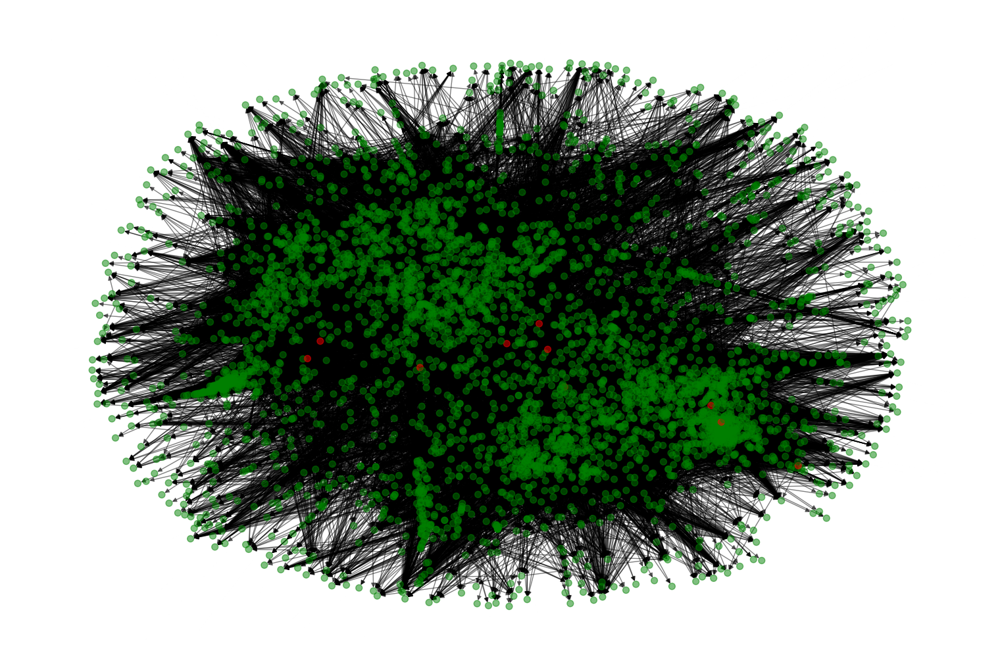

In [51]:
degree_dict = dict(G.degree(G.nodes()))
nx.set_node_attributes(G, degree_dict, 'degree')
sorted_degree = sorted(degree_dict.items(), key=itemgetter(1), reverse=True)
nodes = [tup[0] for tup in sorted_degree[:10]]
color_map = ['red' if node in nodes else 'green' for node in G.nodes()]
pos = nx.spring_layout(G)  # or use another layout algorithm
plt.figure(figsize=(15, 10))
nx.draw(G, node_color=color_map, with_labels=False, pos=pos,node_size=50, alpha=0.5)
plt.show()

In [42]:
in_degrees = dict(G.in_degree())

# Calculate the outgoing degree of each node
out_degrees = dict(G.out_degree())

# Find the node with the highest incoming degree
node_with_max_in_degree = max(in_degrees, key=in_degrees.get)
print(f" Node with hishest in degree : {node_with_max_in_degree}")
# Find the node with the highest outgoing degree
node_with_max_out_degree = max(out_degrees, key=out_degrees.get)
print(f" Node with hishest out degree : {node_with_max_out_degree}")

 Node with hishest in degree : 1888
 Node with hishest out degree : 107


In [50]:
highest_in_degrees = nlargest(10, in_degrees, key = in_degrees.get)
highest_out_degrees = nlargest(10, out_degrees, key = out_degrees.get)
for i in highest_in_degrees:
    print(f'Node {i}: Degree {in_degrees[i]}')

Node 1888: Degree 251
Node 2543: Degree 246
Node 1800: Degree 216
Node 2611: Degree 197
Node 1827: Degree 186
Node 1730: Degree 183
Node 2607: Degree 183
Node 1833: Degree 182
Node 2602: Degree 182
Node 2604: Degree 182


In [45]:
for i in highest_out_degrees:
    print(f'Node {i}: Degree {out_degrees[i]}')

Node 107: Degree 1043
Node 1684: Degree 778
Node 1912: Degree 748
Node 3437: Degree 542
Node 0: Degree 347
Node 348: Degree 225
Node 1941: Degree 215
Node 1985: Degree 207
Node 483: Degree 191
Node 1917: Degree 189


# 6)

In [18]:
betweenness = nx.centrality.betweenness_centrality(G) 
highest_betweenness_node = max(G.nodes, key=betweenness.get)
b=betweenness[highest_betweenness_node]
print("Node: {} {}Betweenness: {}".format(highest_betweenness_node,'\n',b))

Node: 1684 
Betweenness: 0.03299985344063623


Nodes with **high betweenness** centrality are crucial in connecting different parts of the network. They act as **bridges** or intermediaries, facilitating the flow of information, resources, or influence between other nodes. These central nodes play a vital role in maintaining the network's connectivity and communication.

In [52]:
closeness = nx.centrality.closeness_centrality(G) 
highest_closeness_node = max(G.nodes, key=closeness.get)
c=closeness[highest_closeness_node]
print("Node: {} {}Closeness: {}".format(highest_closeness_node, '\n',c))

Node: 2642 
Closeness: 0.11797503012816456


In [53]:
close = nlargest(10, closeness, key=closeness.get)
for i in close:
    print(f'Node {i}: Closeness {closeness[i]}')

Node 2642: Closeness 0.11797503012816456
Node 2649: Closeness 0.11793232689533308
Node 2629: Closeness 0.11629338421878259
Node 2643: Closeness 0.11591804904451317
Node 2543: Closeness 0.11590243183892303
Node 2598: Closeness 0.11575806082880183
Node 2653: Closeness 0.11445163014209331
Node 2617: Closeness 0.1124444577085752
Node 2616: Closeness 0.1123491465226688
Node 2555: Closeness 0.11138475818308745


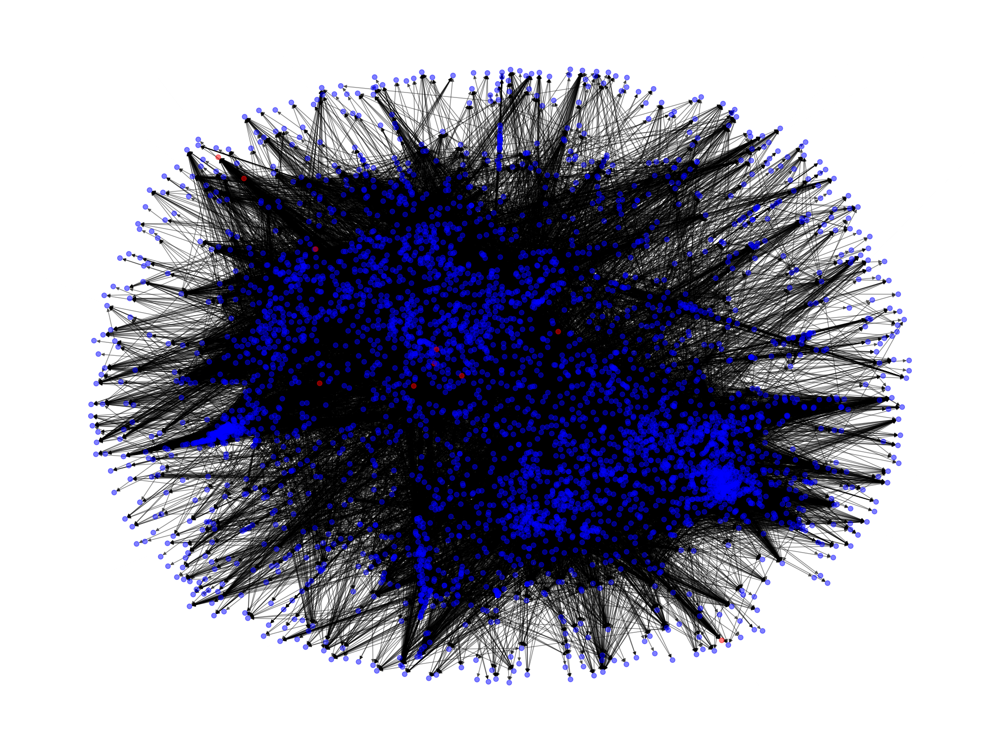

In [55]:
closeness_dict = nx.closeness_centrality(G) 
nx.set_node_attributes(G, closeness_dict, 'closeness') 
sorted_closeness = sorted(closeness_dict.items(), key=itemgetter(1), reverse=True)
nodes=[tup[0] for tup in sorted_closeness[:10]]
color_map = ['red' if node in nodes else 'blue' for node in G]
plt.figure(figsize=(20, 15))
nx.draw(G, node_color=color_map, with_labels=False, pos=pos,node_size=50, alpha=0.5)
plt.show()

In [57]:
betweenness_dict = nx.betweenness_centrality(G)
bridges = nlargest(10, betweenness_dict, key=betweenness_dict.get)
for i in bridges:
    print(f'Node {i}: Betweenness {betweenness_dict[i]}')

Node 1684: Betweenness 0.03299985344063623
Node 1912: Betweenness 0.027145672353148857
Node 1718: Betweenness 0.026577614223444346
Node 563: Betweenness 0.01300961569074186
Node 1405: Betweenness 0.010123670299605515
Node 1656: Betweenness 0.009425937129610911
Node 1086: Betweenness 0.008553563518788857
Node 567: Betweenness 0.008300375906658487
Node 3437: Betweenness 0.008194350620311139
Node 119: Betweenness 0.006358997369476009


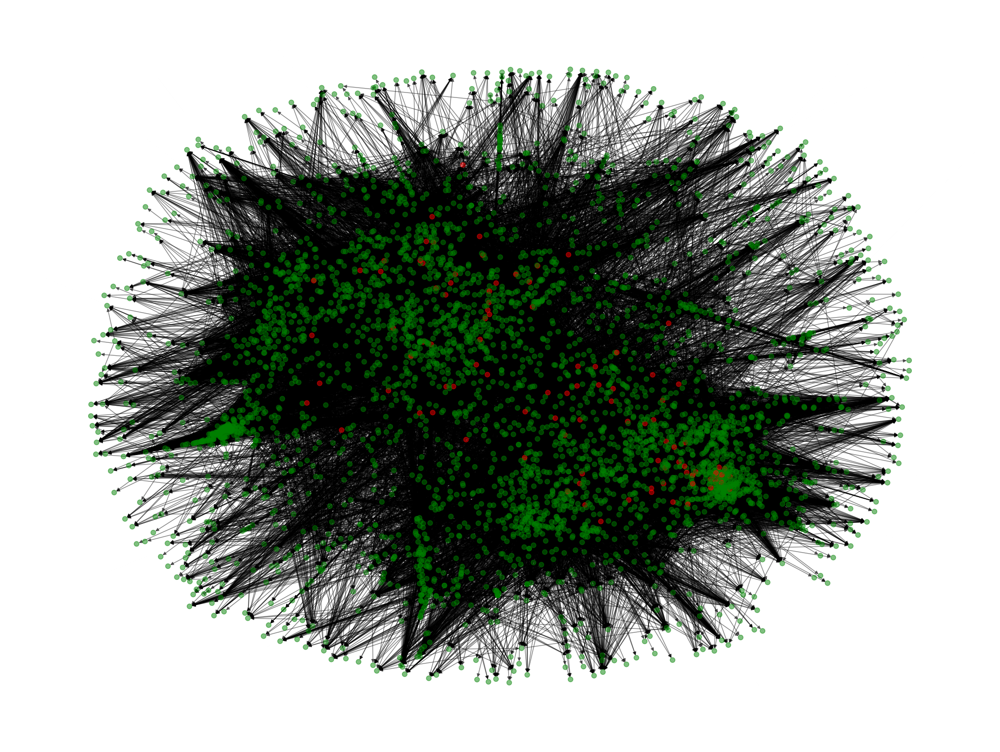

In [54]:
nx.set_node_attributes(G, betweenness_dict, 'betweenness') 
sorted_betweenness = sorted(betweenness_dict.items(), key=itemgetter(1), reverse=True)
nodes=[tup[0] for tup in sorted_betweenness[:100]]
color_map = ['red' if node in nodes else 'green' for node in G]
plt.figure(figsize=(20, 15))
nx.draw(G, node_color=color_map, with_labels=False, pos=pos,node_size=50, alpha=0.5)
plt.show()

In [58]:
eigenvector_in = nx.eigenvector_centrality(G, max_iter=300)
eigenvector_out = nx.eigenvector_centrality(G.reverse(), max_iter=300)

# calculating eigenvector centralities for every node
eigenvector = {}
for key in eigenvector_in.keys():
    eigenvector[key] = (eigenvector_in[key] + eigenvector_out[key])/2
    
# top 10 nodes with higest eigen vector
e_vec = nlargest(10, eigenvector, key=eigenvector.get)
for i in e_vec:
    print(f'Node {i}: Eigenvector {eigenvector[i]}')

Node 0: Eigenvector 0.4419361459191112
Node 2655: Eigenvector 0.401352149835326
Node 2654: Eigenvector 0.23993423112534548
Node 3: Eigenvector 0.1486317868904883
Node 9: Eigenvector 0.12565044899639224
Node 2646: Eigenvector 0.11377629041020572
Node 13: Eigenvector 0.0907191228782389
Node 2638: Eigenvector 0.08909843274277295
Node 2631: Eigenvector 0.08346591284941769
Node 21: Eigenvector 0.07700765665617419


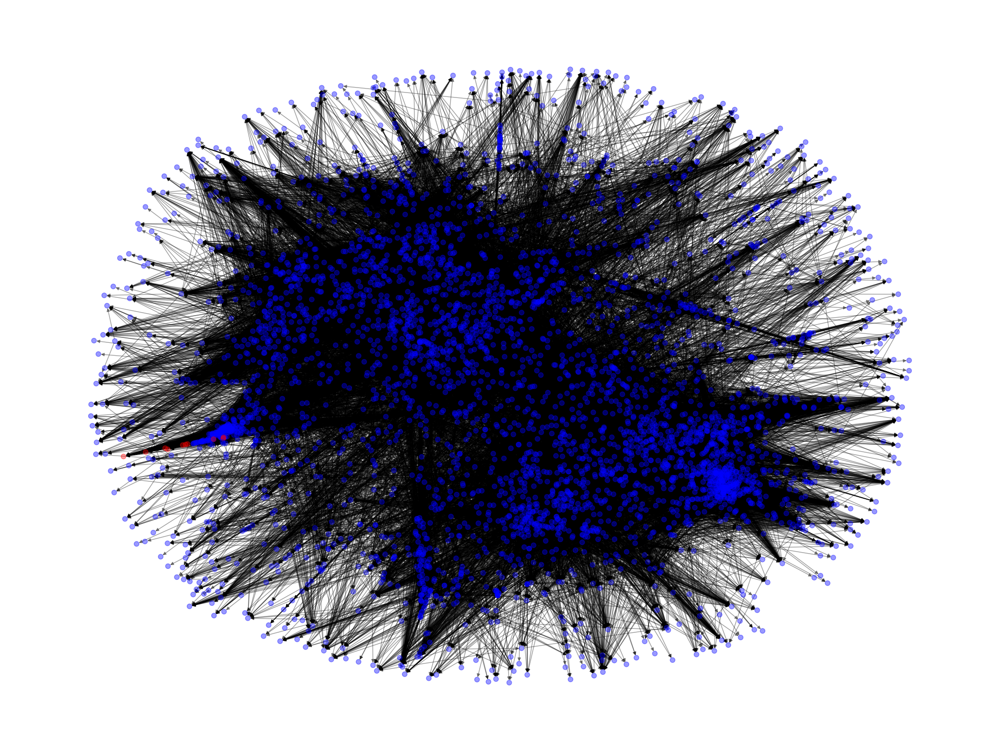

In [60]:
eigen_dict = nx.eigenvector_centrality(G,max_iter=1000)
nx.set_node_attributes(G, eigen_dict, 'eigan')
sorted_eigen = sorted(eigen_dict.items(), key=itemgetter(1), reverse=True) 
nodes=[tup[0] for tup in sorted_eigen[:10]]
color_map = ['red' if node in nodes else 'blue' for node in G]
plt.figure(figsize=(20, 15))
nx.draw(G, node_color=color_map, with_labels=False, pos=pos,node_size=50, alpha=0.4)
plt.show()

In [61]:
node_with_max_closeness = max(closeness_dict, key=closeness_dict.get)

# Find the node with the highest betweenness centrality
node_with_max_betweenness = max(betweenness_dict, key=betweenness_dict.get)

# Find the node with the highest eigenvector centrality
node_with_max_eigenvector = max(eigen_dict, key=eigen_dict.get)


In [69]:
print(f" \n-- Node with the highest closeness centrality: - {node_with_max_closeness} - This node with the highest closeness centrality is the one \n that, when directed edges are taken into account, is either most central or closest to all other nodes in terms of geodesic distance. It symbolizes a node that, depending on the directed connections,may instantly interact and communicate with other nodes in the network \n")
print(f"-- Node with the highest betweenness centrality: - {node_with_max_betweenness} - This node with the highest betweenness centrality serves as a vital link or mediator between different areas of the directed graph. It denotes a node that regularly appears on the directed shortest pathways connecting other nodes and may be in charge of directing the flow of data \n")
print(f"-- Node with the highest eigenvector centrality: -  {node_with_max_eigenvector} - This node with the highest eigenvector centrality is the one that has the greatest influence in the directed network based on connections to other highly connected nodes. \n It depicts a node that is prominent within the directed graph because of links to other significant nodes. ")

 
-- Node with the highest closeness centrality: - 2642 - This node with the highest closeness centrality is the one 
 that, when directed edges are taken into account, is either most central or closest to all other nodes in terms of geodesic distance. It symbolizes a node that, depending on the directed connections,may instantly interact and communicate with other nodes in the network 

-- Node with the highest betweenness centrality: - 1684 - This node with the highest betweenness centrality serves as a vital link or mediator between different areas of the directed graph. It denotes a node that regularly appears on the directed shortest pathways connecting other nodes and may be in charge of directing the flow of data 

-- Node with the highest eigenvector centrality: -  2655 - This node with the highest eigenvector centrality is the one that has the greatest influence in the directed network based on connections to other highly connected nodes. 
 It depicts a node that is prominent 

-------

# 7)

In [9]:
def findCommunities(G):
    im = Infomap("--two-level --directed")
    print("Building Infomap network from a NetworkX graph...") 
    for e in G.edges():
        im.addLink(*e)
    print("Find communities with Infomap...")
    im.run();
    print("Found {0} communities with codelength: {1}".format(im.num_top_modules,im.codelength))
    communities = {}
    for node in im.tree:
        communities[node.node_id] = node.module_id 
    nx.set_node_attributes(G, communities,'community') 
    return im.num_top_modules

In [10]:
print(findCommunities(G))

Building Infomap network from a NetworkX graph...
Find communities with Infomap...
Found 98 communities with codelength: 6.587416522147203
  Infomap v2.7.1 starts at 2023-05-18 22:29:44
  -> Input network: 
  -> No file output!
  -> Configuration: two-level
                    directed
  -> Ordinary network input, using the Map Equation for first order network flows
Calculating global network flow using flow model 'directed'... 98

  -> Using unrecorded teleportation to links. 
  -> PageRank calculation done in 84 iterations.

  => Sum node flow: 1, sum link flow: 1
Build internal network with 4039 nodes and 88234 links...
  -> One-level codelength: 9.86597315

Trial 1/1 starting at 2023-05-18 22:29:44
Two-level compression: 33% 0.72% 0.0611712068% 0.0123350569% 

- acording to the code above it found **98** communites

In [11]:
# creating a dict of nodes and their corresponding communities
nodes_comm = dict((n, d["community"]) for n, d in G.nodes().items())

In [12]:
comms = np.array(list(nodes_comm.values()))
# taking unique communities
distinct_comms = np.unique(comms)

In [13]:
distinct_comms

array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17,
       18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34,
       35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51,
       52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68,
       69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85,
       86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98])

In [14]:
# dictionary for each communitie and the number of nodes there
comm_count = {}


for com in distinct_comms:
    count = np.count_nonzero(comms == com)
    comm_count[com] = count
    

In [15]:
comm_with_max_count = nlargest(5,comm_count, key=comm_count.get)
comm_with_min_count = nsmallest(5,comm_count, key=comm_count.get)

In [16]:
for i in comm_with_max_count:
    print(f'Community {i} with {comm_count[i]} nodes')

Community 5 with 432 nodes
Community 3 with 333 nodes
Community 2 with 271 nodes
Community 1 with 236 nodes
Community 6 with 226 nodes


In [17]:
for i in comm_with_min_count:
    print(f'Community {i} with {comm_count[i]} nodes')

Community 38 with 2 nodes
Community 72 with 2 nodes
Community 86 with 2 nodes
Community 87 with 2 nodes
Community 89 with 2 nodes


In [18]:
print(f"Largest community is {comm_with_max_count[0]}, with {comm_count[comm_with_max_count[0]]} nodes")
print(f"Smallest community is {comm_with_min_count[0]}, with {comm_count[comm_with_min_count[0]]} nodes")

Largest community is 5, with 432 nodes
Smallest community is 38, with 2 nodes


By identifing the this two communities  the largest and smallest communities it will help the identification of offers opportunities for targeted marketing actions. Such as the small communities will be preferable for the nitch market and they need more cutomised actions. Smaller communites encourage a sense of close-knit relationships among its members. Businesses may engage with customers on a more personal level, encouraging loyalty and building deeper relationships, by focusing on the smallest communities. Higher customer satisfaction and a higher customer lifetime value may result from this individualized strategy. the same goes and can be applied for the largeest comunities. he largest communities represent groups of individuals or entities that are tightly connected within their respective communities. Identifying these communities can provide valuable targeting opportunities, as they may have distinct characteristics, preferences, or behaviors that can be leveraged for marketing actions. By focusing on the largest communities, a business can concentrate its resources on reaching a significant portion of the network efficiently. They are more likely to have powerful nodes with high centrality scores which have a significant impact on how information is disseminated, how attitudes are formed, and how actions are taken within their communities. The marketing message can be amplified, increasing the likelihood that it will be adopted and spread by focusing on these powerful nodes inside the largest communities.

In [19]:
selected_data = dict((n,d['community']) for n,d in G.nodes().items() if d['community'] == 5) 
sg=G.subgraph(list(selected_data.keys()))
print(f"Graph Density: {(nx.density(sg))}")

Graph Density: 0.042252083870413334


In [20]:
selected_data = dict((n,d['community']) for n,d in G.nodes().items() if d['community'] == 38) 
sg=G.subgraph(list(selected_data.keys()))
print(f"Graph Density: {(nx.density(sg))}")

Graph Density: 0.5


In [ ]:
small communites are more dense due to the result that i obtained above

### bellow i just also visualised some communities with smallest highest and random number of nodes

In [10]:
selected_data = dict((n,d['community']) for n,d in G.nodes().items() if d['community'] == 5) 
sg=G.subgraph(list(selected_data.keys()))
pos = nx.spring_layout(sg, seed=5656)

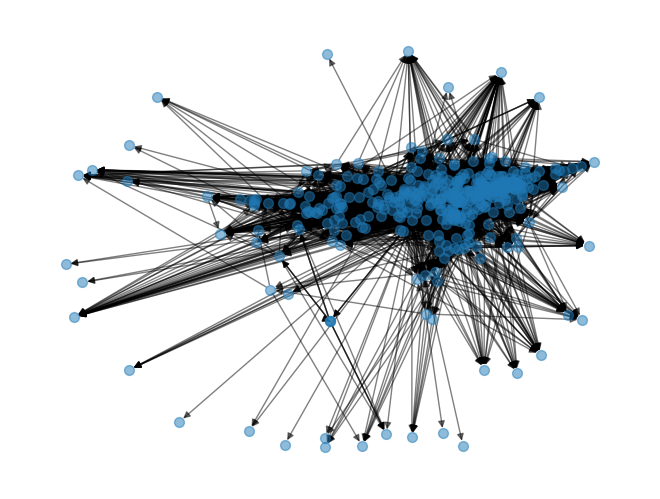

In [11]:
nx.draw(sg, pos=pos,node_size=50, alpha=0.5)
plt.show()

In [16]:
selected_data_2 = dict((n,d['community']) for n,d in G.nodes().items() if d['community'] == 11) 
sg2=G.subgraph(list(selected_data_2.keys()))
pos2 = nx.spring_layout(sg2, seed=5656)

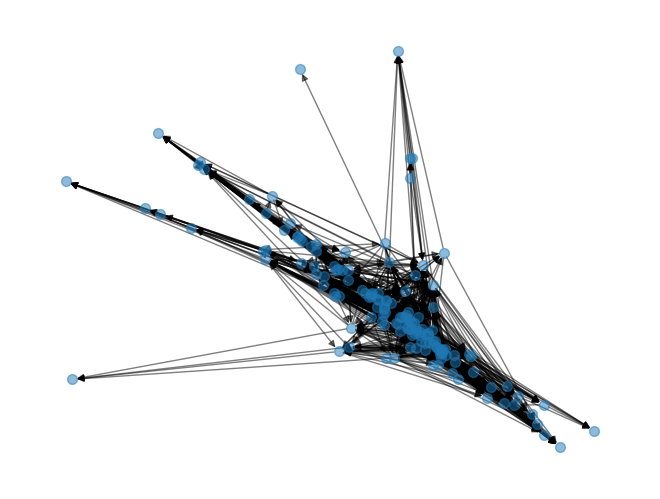

In [17]:
nx.draw(sg2, pos=pos2,node_size=50, alpha=0.5)
plt.show()

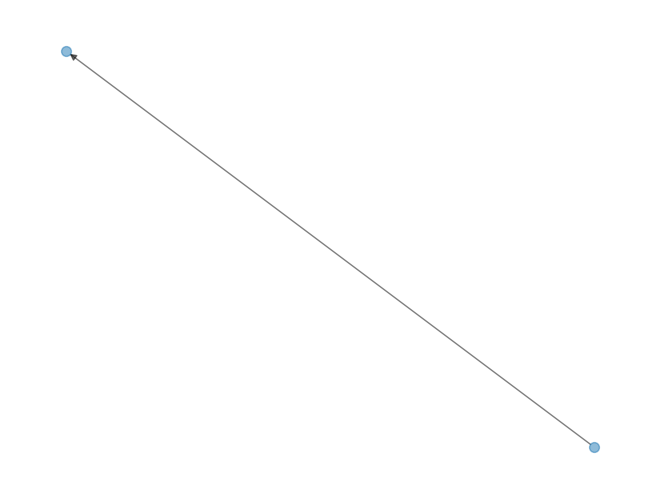

In [19]:
selected_data_3 = dict((n,d['community']) for n,d in G.nodes().items() if d['community'] == 38) 
sg3=G.subgraph(list(selected_data_3.keys()))
pos3 = nx.spring_layout(sg3, seed=5656)
nx.draw(sg3, pos=pos3,node_size=50, alpha=0.5)
plt.show()

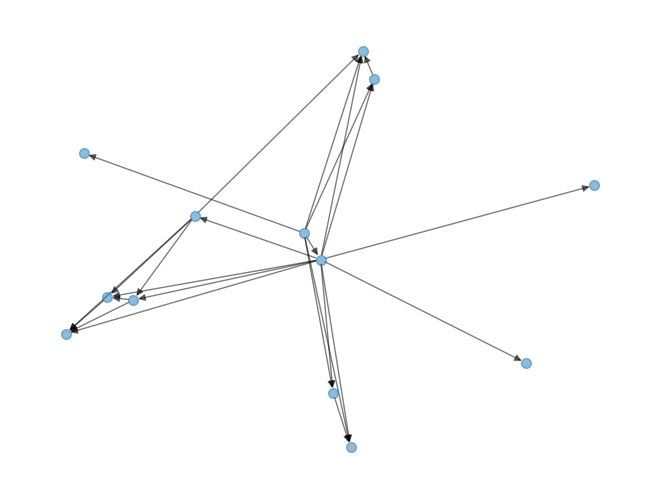

In [29]:
selected_data_4 = dict((n,d['community']) for n,d in G.nodes().items() if d['community'] == 62) 
sg4=G.subgraph(list(selected_data_4.keys()))
pos4 = nx.spring_layout(sg4, seed=5656)
nx.draw(sg4, pos=pos4,node_size=50, alpha=0.5)
plt.show()

## 9)

In [39]:
for i in comm_with_max_count[:3]:
    print(f'Community {i} with {comm_count[i]} nodes')

Community 5 with 432 nodes
Community 3 with 333 nodes
Community 2 with 271 nodes


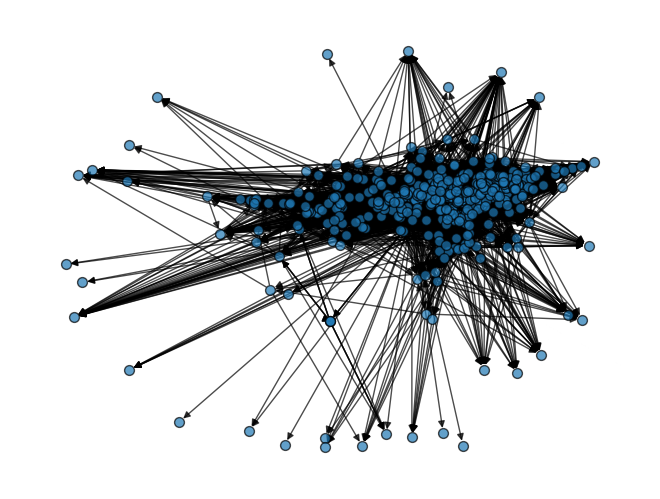

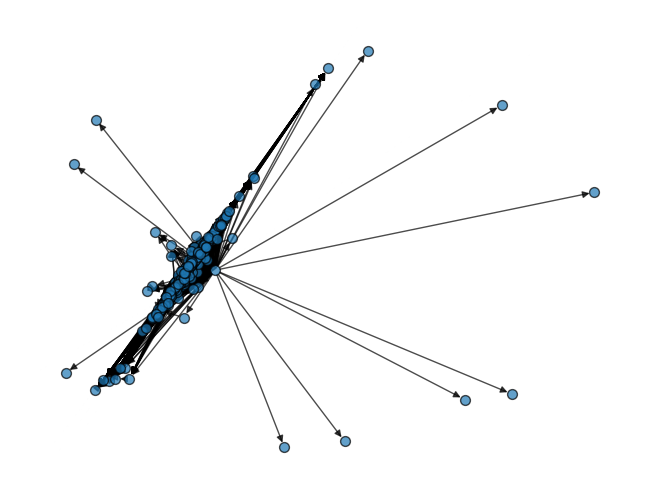

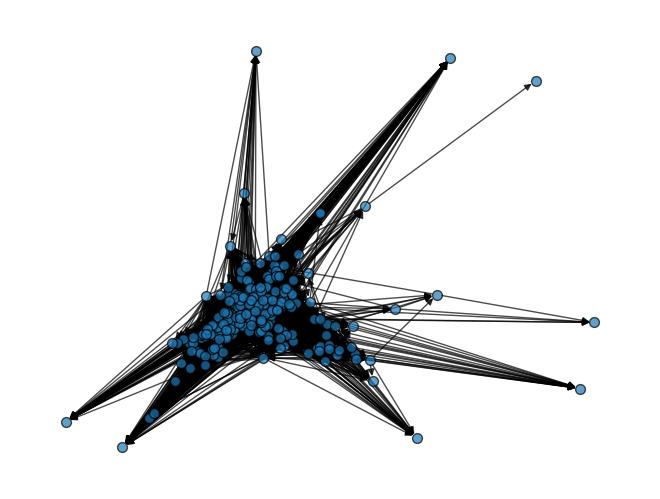

In [42]:
for i in comm_with_max_count[:3]:
    selected_data = dict((n,d['community']) for n,d in G.nodes().items() if d['community'] == i) 
    sg=G.subgraph(list(selected_data.keys()))
    pos = nx.spring_layout(sg, seed=5656)
    nx.draw(sg, pos=pos,node_size=50, alpha=0.7,edgecolors='black')
    plt.show()

In [47]:
for i in comm_with_max_count[:3]:
    selected_data = dict((n,d['community']) for n,d in G.nodes().items() if d['community'] == i) 
    sg=G.subgraph(list(selected_data.keys()))
    pos = nx.spring_layout(sg, seed=5656)
    degree = nlargest(3, nx.centrality.degree_centrality(sg), key=nx.centrality.degree_centrality(sg).get)
    between = nlargest(3, nx.centrality.betweenness_centrality(sg), key=nx.centrality.betweenness_centrality(sg).get)
    close = nlargest(3, nx.centrality.closeness_centrality(sg), key=nx.centrality.closeness_centrality(sg).get)
    eign = nlargest(3, nx.centrality.eigenvector_centrality(sg,max_iter=1000), key=nx.centrality.eigenvector_centrality(sg,max_iter=1000).get)
    print(f"Nodes with highest Centrality Mesures for {i} community ")
    for i in degree:
        print(f'Node {i}: Betweenness {nx.centrality.degree_centrality(sg)[i]}')
    for i in between:
        print(f'Node {i}: Betweenness {nx.centrality.betweenness_centrality(sg)[i]}')
    for i in close:
        print(f'Node {i}: Closeness {nx.centrality.closeness_centrality(sg)[i]}')
    for i in eign:
        print(f'Node {i}: Eigenvector {nx.centrality.eigenvector_centrality(sg,max_iter=1000)[i]} \n')
    print("----------------------------------- \n")
        

Nodes with highest Centrality Mesures for 5 community 
Node 1684: Betweenness 1.0
Node 3101: Betweenness 0.27842227378190254
Node 3291: Betweenness 0.27610208816705334
Node 2951: Betweenness 0.012827308809200537
Node 3101: Betweenness 0.010470261599790543
Node 3154: Betweenness 0.010408366548461731
Node 3434: Closeness 0.47770571965859704
Node 3397: Closeness 0.4738012374323279
Node 3406: Closeness 0.4369007800469994
Node 3434: Eigenvector 0.9942693471647049 

Node 3422: Eigenvector 0.07886121189616431 

Node 3419: Eigenvector 0.04161532457992983 

----------------------------------- 

Nodes with highest Centrality Mesures for 3 community 
Node 107: Betweenness 1.0
Node 1800: Betweenness 0.677710843373494
Node 1663: Betweenness 0.6686746987951807
Node 1352: Betweenness 0.008462892852108496
Node 1471: Betweenness 0.006931615636648119
Node 1431: Betweenness 0.006481722891275275
Node 1800: Closeness 0.685664769631289
Node 1827: Closeness 0.6548819713242108
Node 1833: Closeness 0.653202496

In [41]:
def graphing(community):
    
    selected_data = {n: d['community'] for n, d in G.nodes(data=True) if d['community'] == community}
    sg = G.subgraph(list(selected_data.keys()))
    
#     nx.draw(sg, pos, node_size=100, alpha=0.7,with_labels=False,edgecolors='black')
#     plt.title(f"Community {community} ")
#     plt.show()
    
    
    # Top 3 nodes with highest Degree Centrality in the community
    degree_top3 = nlargest(3, nx.degree_centrality(sg), key=nx.degree_centrality(sg).get)
    colors = ["red" if node in degree_top3 else "blue" for node in sg.nodes()]
    plt.figure()
    pos = nx.spring_layout(sg, seed=5656)
    nx.draw(sg, pos, node_color=colors,node_size=100, alpha=0.7,with_labels=False,edgecolors='black')
    plt.title(f"Community {community}: Graph with top nodes based on Degree Centrality highlighted")
    plt.show()
    
    sg_degree_removed = sg.copy()
    sg_degree_removed.remove_nodes_from(degree_top3)
    
    plt.figure()
#     pos = nx.spring_layout(sg_degree_removed, seed=5656)
    nx.draw(sg_degree_removed,pos,node_color="yellow", node_size=100, alpha=0.7,with_labels=False,edgecolors='black')
    plt.title(f"Community {community}: Graph after removing top nodes based on Degree Centrality")
    plt.show()
    
    # Top 3 nodes with highest Closeness Centrality in the community
    closeness_top3 = nlargest(3, nx.closeness_centrality(sg), key=nx.closeness_centrality(sg).get)
    colors = ["red" if node in closeness_top3 else "blue" for node in sg.nodes()]
    plt.figure()
#     pos = nx.spring_layout(sg, seed=5656)
    nx.draw(sg, pos, node_color=colors,node_size=100, alpha=0.7,with_labels=False,edgecolors='black')
    plt.title(f"Community {community}: Graph with top nodes based on Closeness Centrality highlighted")
    plt.show()
    
    sg_closeness_removed = sg.copy()
    sg_closeness_removed.remove_nodes_from(closeness_top3)
    
    plt.figure()
#     pos = nx.spring_layout(sg_closeness_removed, seed=5656)
    nx.draw(sg_closeness_removed, pos, node_color="yellow", node_size=100, alpha=0.7, with_labels=False,edgecolors='black')
    plt.title(f"Community {community}: Graph after removing top nodes based on Closeness Centrality")
    plt.show()
    
    # Top 3 nodes with highest Betweenness Centrality in the community
    betweenness_top3 = nlargest(3, nx.betweenness_centrality(sg), key=nx.betweenness_centrality(sg).get)
    colors = ["red" if node in betweenness_top3 else "blue" for node in sg.nodes()]
    plt.figure()
#     pos = nx.spring_layout(sg, seed=5656)
    nx.draw(sg, pos, node_color=colors,node_size=100, alpha=0.7,with_labels=False,edgecolors='black')
    plt.title(f"Community {community}: Graph with top nodes based on Betweenness Centrality highlighted")
    plt.show()
    
    sg_betweenness_removed = sg.copy()
    sg_betweenness_removed.remove_nodes_from(betweenness_top3)
    
    plt.figure()
#     pos = nx.spring_layout(sg_betweenness_removed, seed=5656)
    nx.draw(sg_betweenness_removed,pos,node_color="yellow", node_size=100, alpha=0.7,with_labels=False,edgecolors='black')
    plt.title(f"Community {community}: Graph after removing top nodes based on Betweenness Centrality")
    plt.show()
    
    # Top 3 nodes with highest Eigenvector Centrality in the community
    eigenvector_top3 = nlargest(3, nx.eigenvector_centrality(sg, max_iter=1000), key=nx.eigenvector_centrality(sg, max_iter=1000).get)
    colors = ["red" if node in eigenvector_top3 else "blue" for node in sg.nodes()]
    plt.figure()
#     pos = nx.spring_layout(sg, seed=5656)
    nx.draw(sg, pos, node_color=colors,node_size=100, alpha=0.7,with_labels=False,edgecolors='black')
    plt.title(f"Community {community}: Graph with top nodes based on Eigenvector Centrality highlighted")
    plt.show()
    
    sg_eigenvector_removed = sg.copy()
    sg_eigenvector_removed.remove_nodes_from(eigenvector_top3)
    
    plt.figure()
#     pos = nx.spring_layout(sg_eigenvector_removed, seed=5656)
    nx.draw(sg_eigenvector_removed, pos,node_color="yellow", node_size=100, alpha=0.7,with_labels=False,edgecolors='black')
    plt.title(f"Community {community}: Graph after removing top nodes based on Eigenvector Centrality")
    plt.show()


graphing(5)

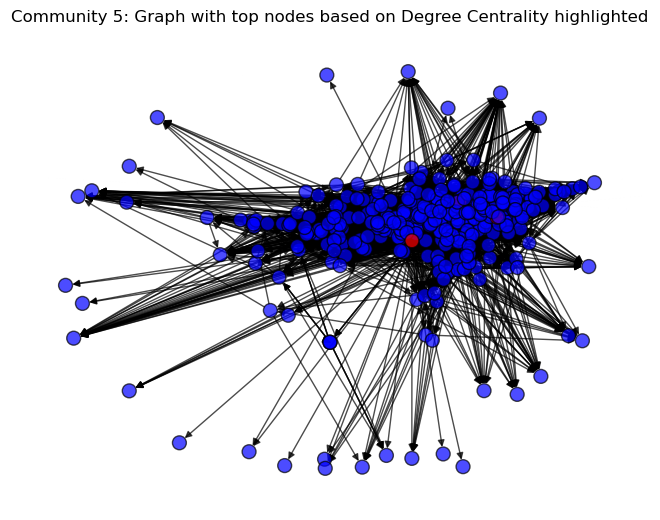

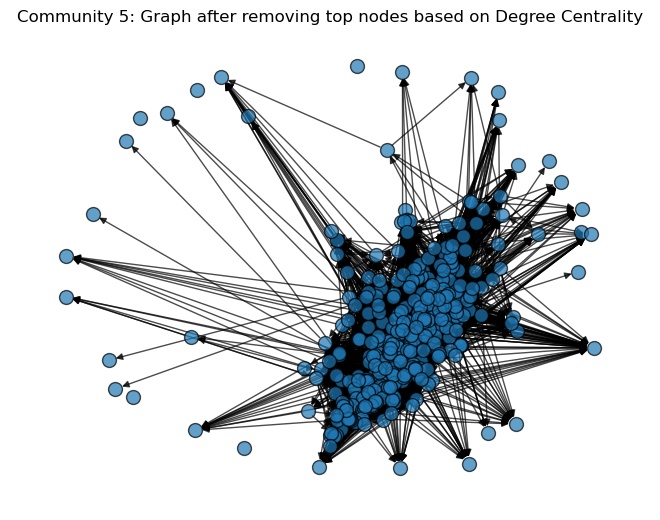

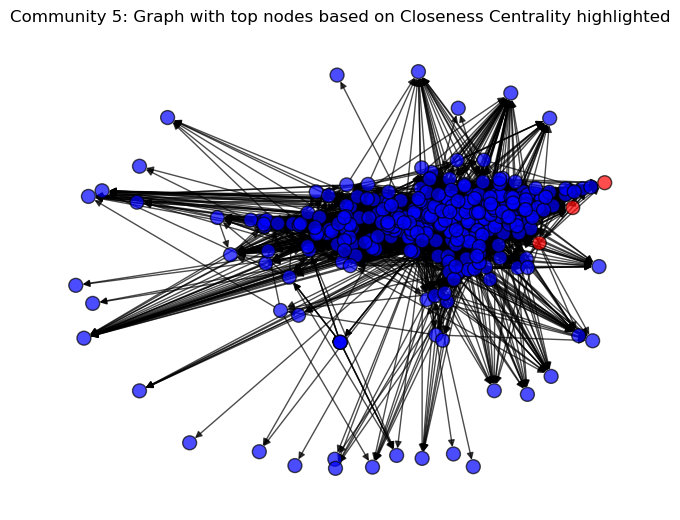

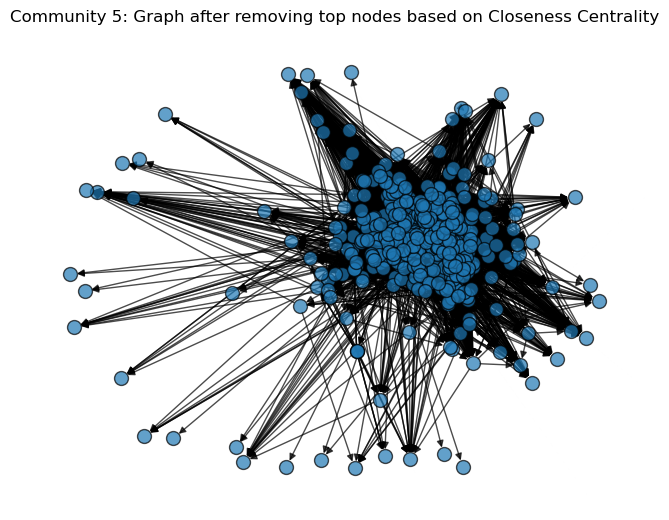

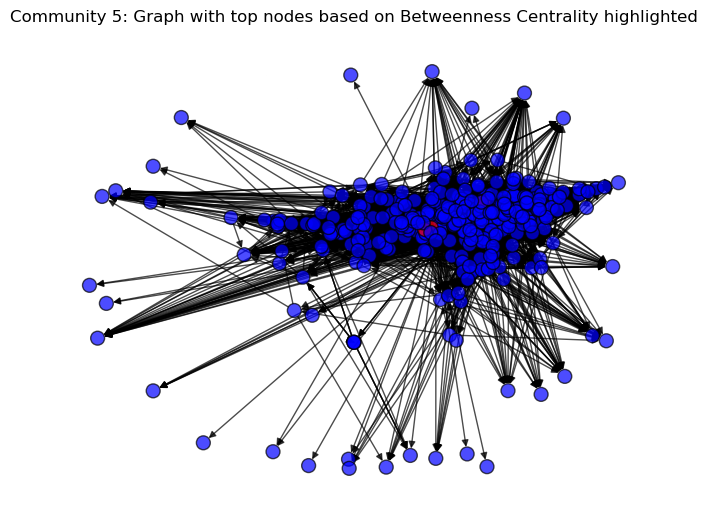

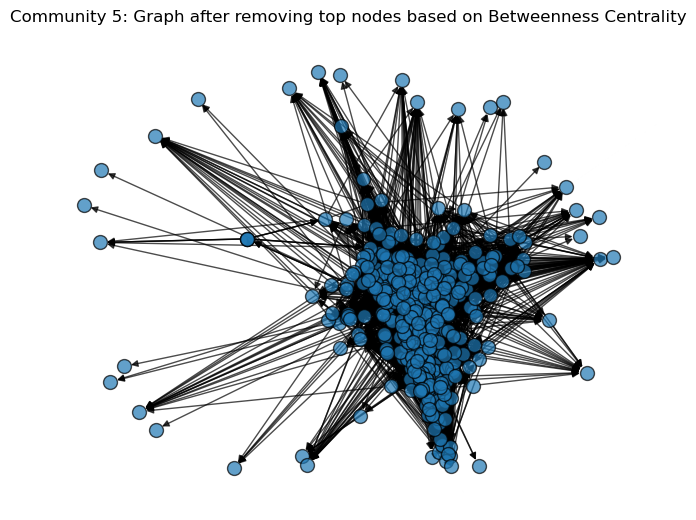

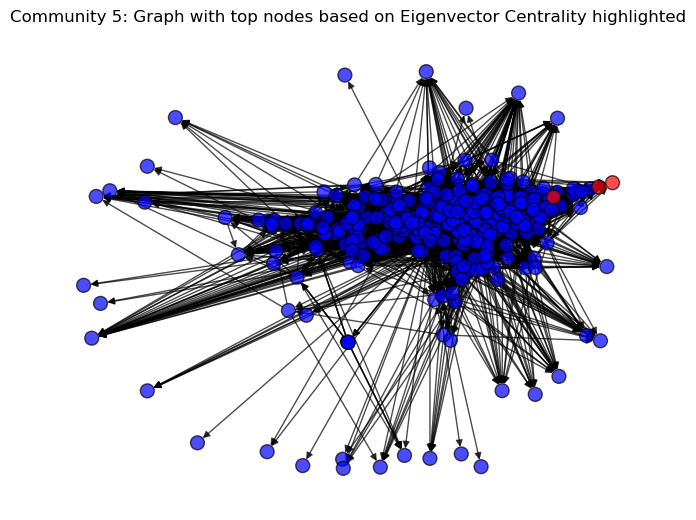

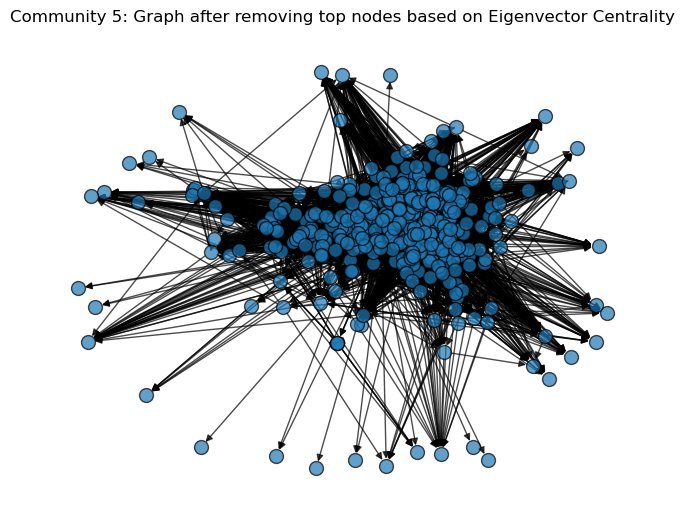

In [20]:
graphing(5)

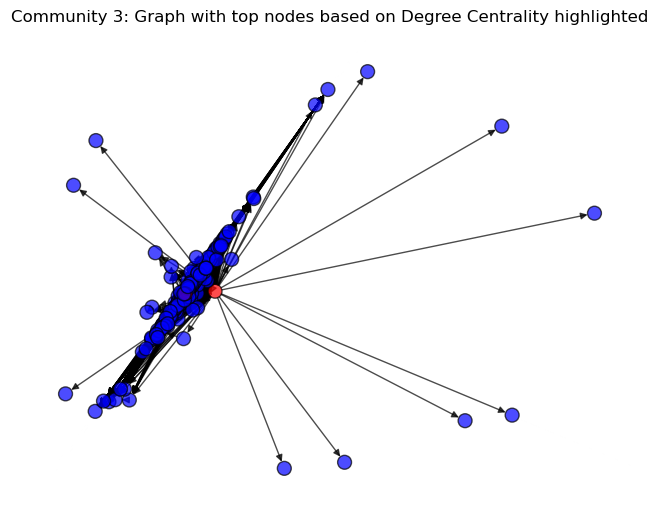

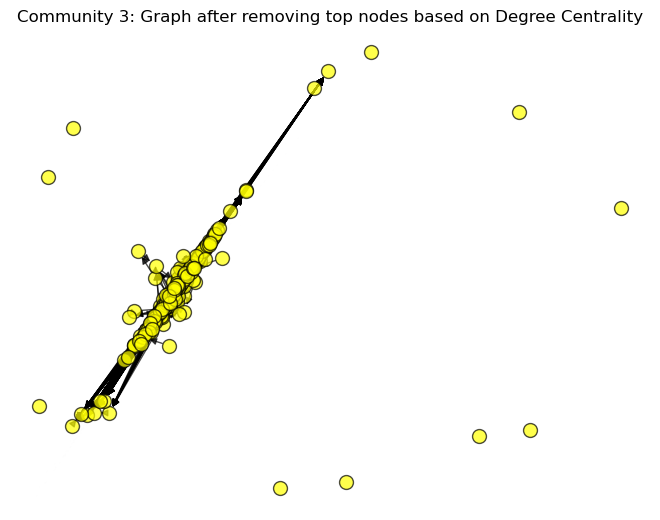

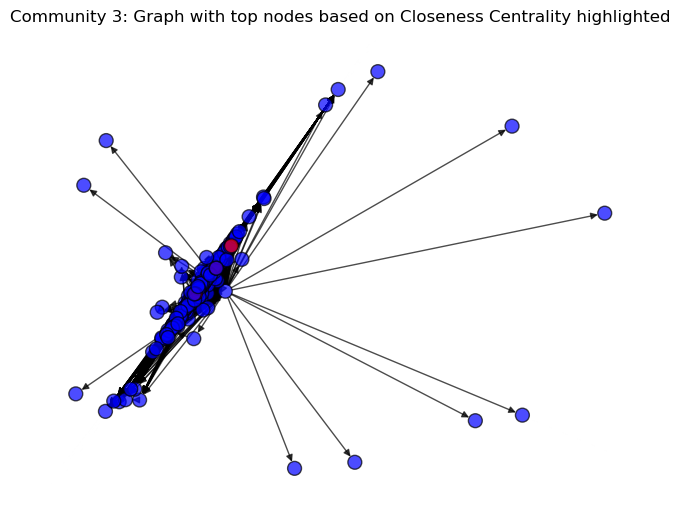

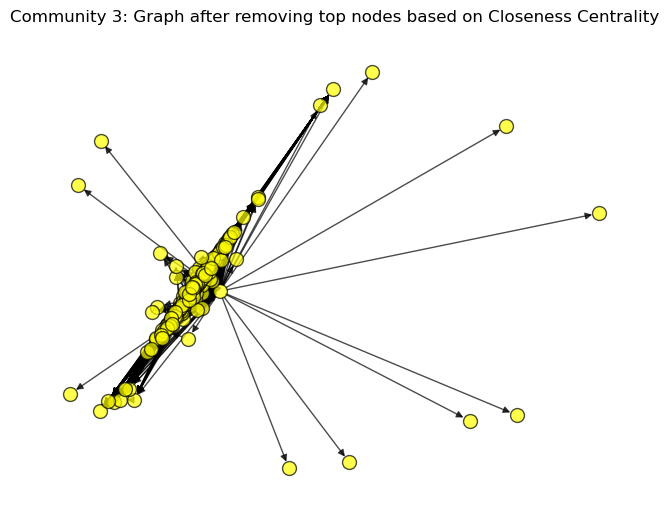

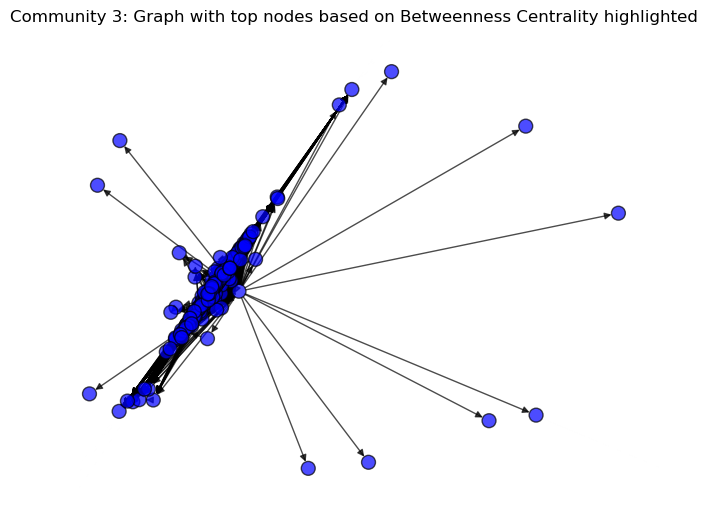

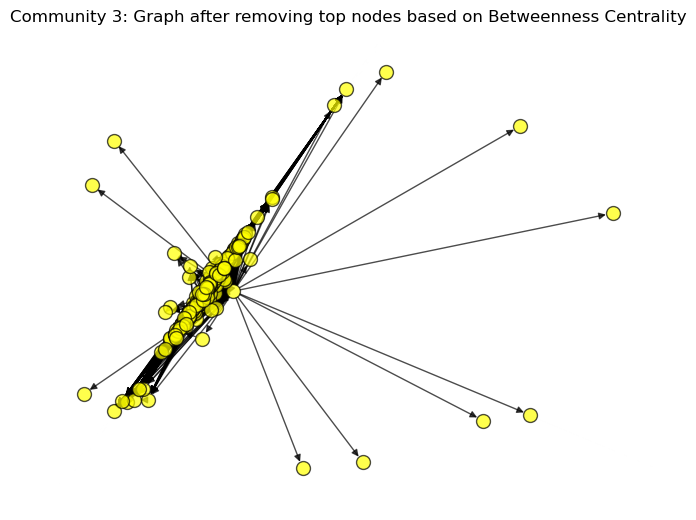

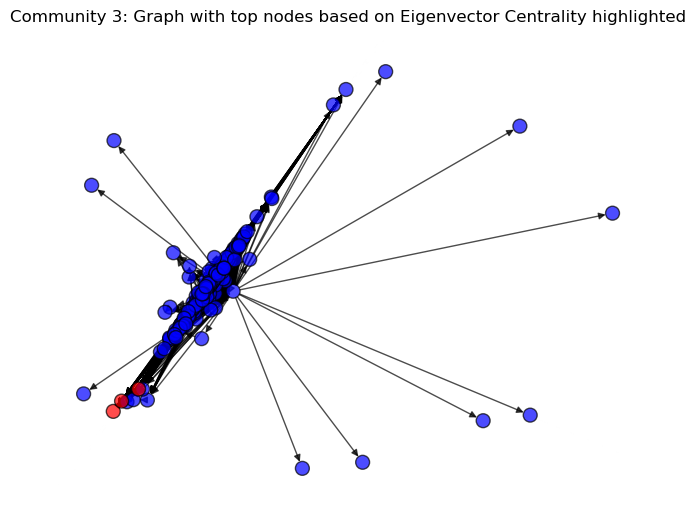

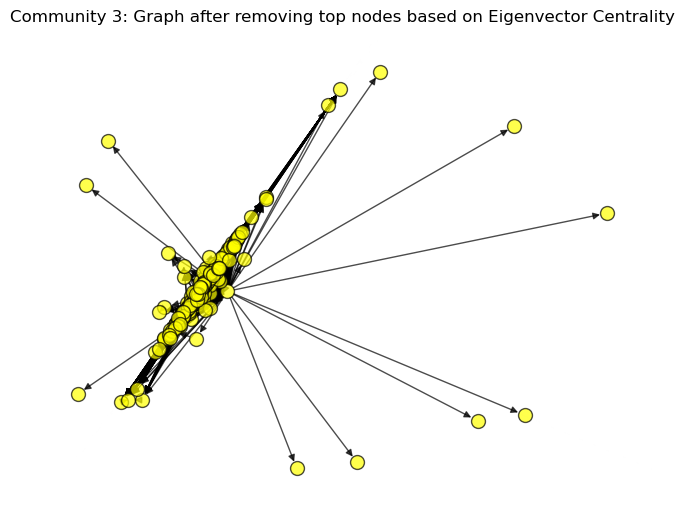

In [42]:
graphing(3)

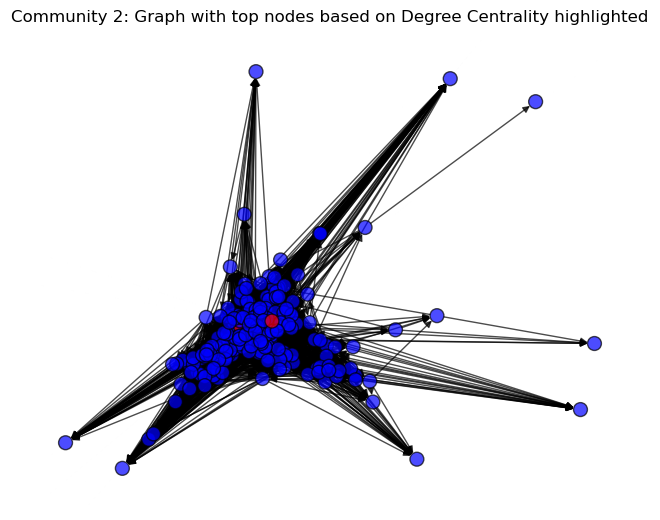

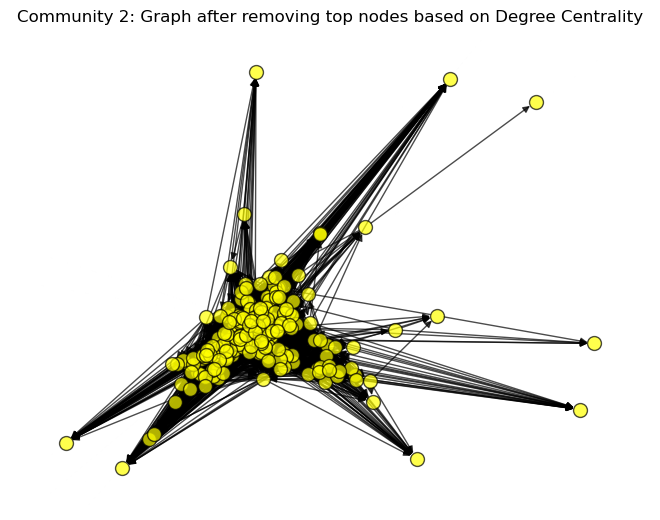

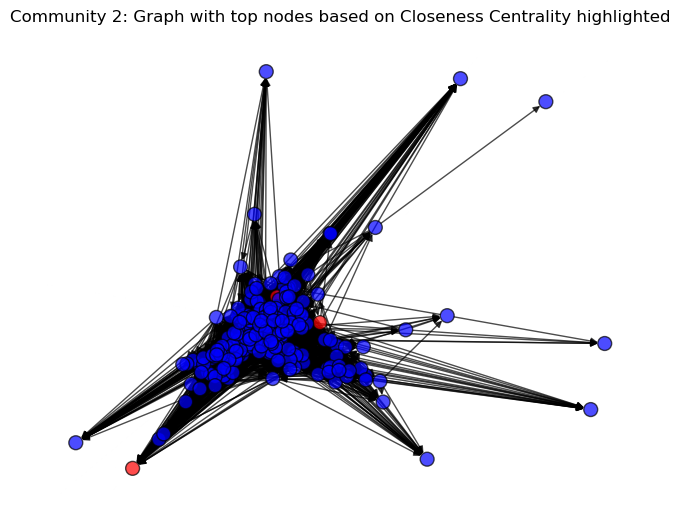

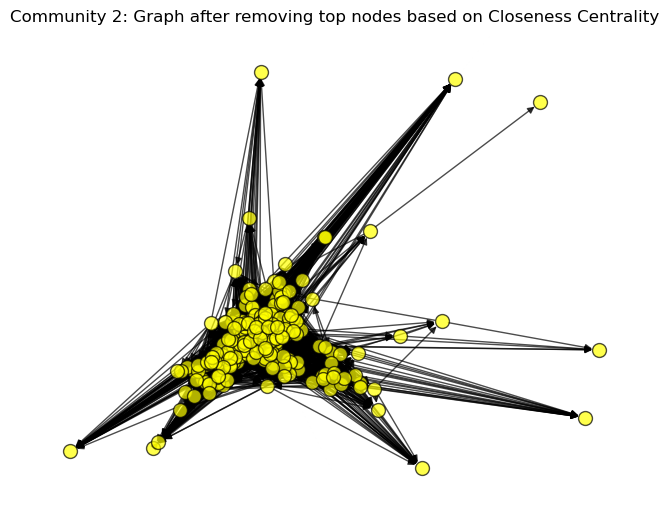

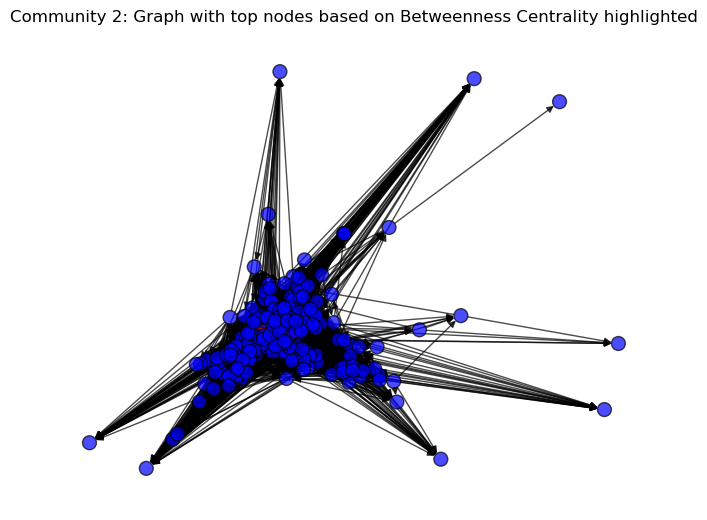

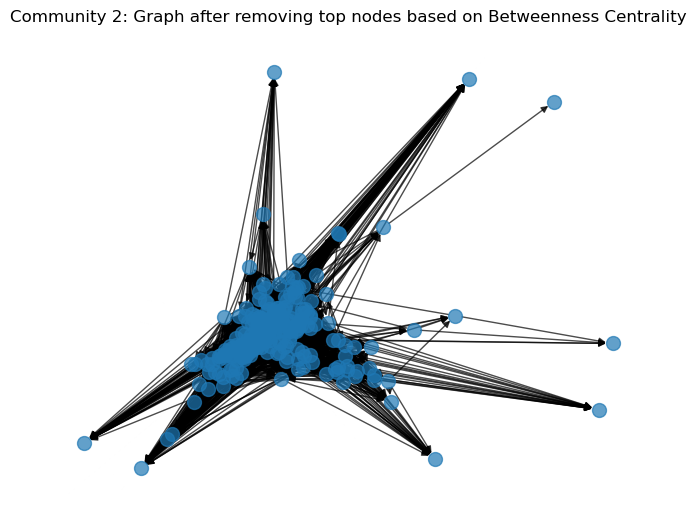

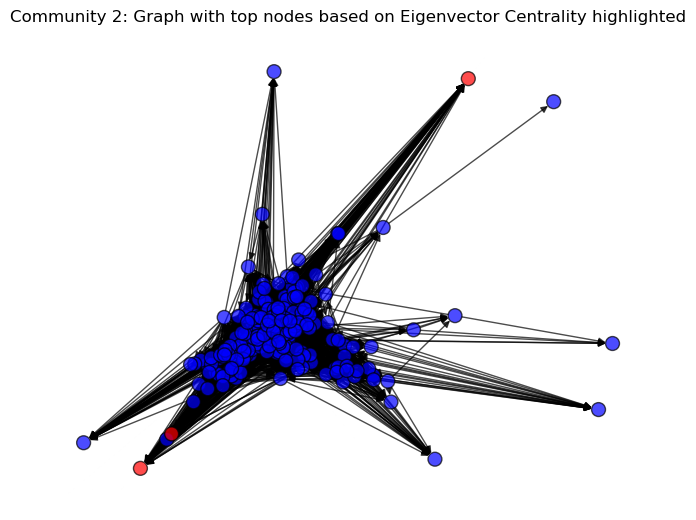

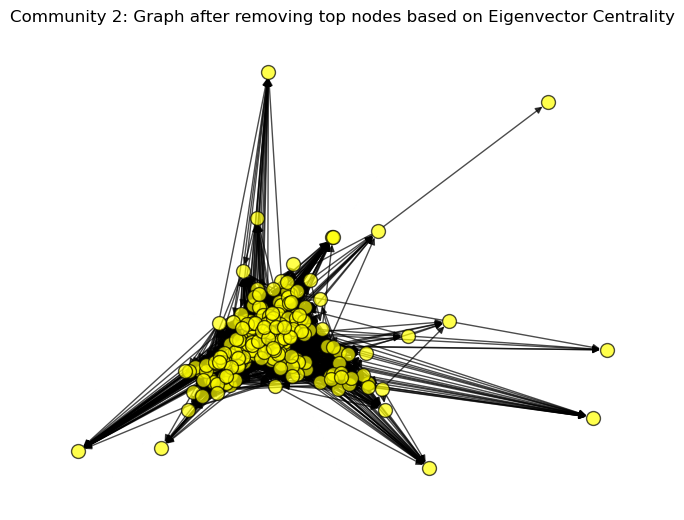

In [40]:
graphing(2)

------

# 10)

-------

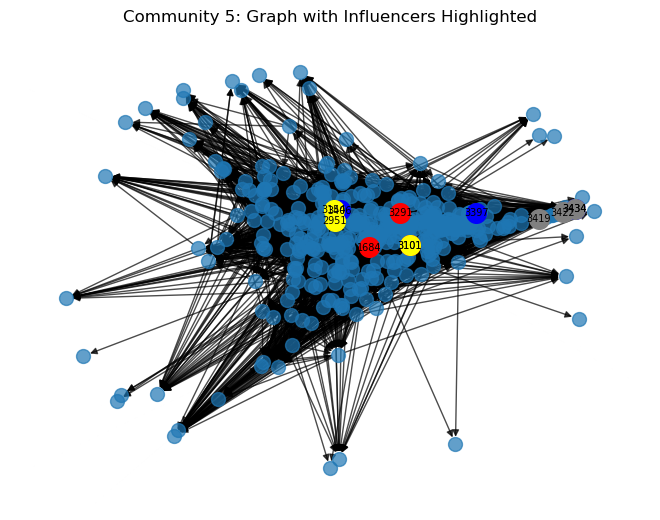

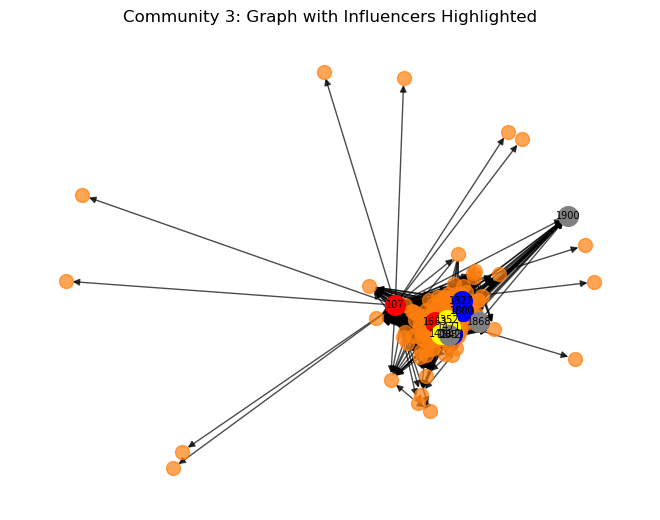

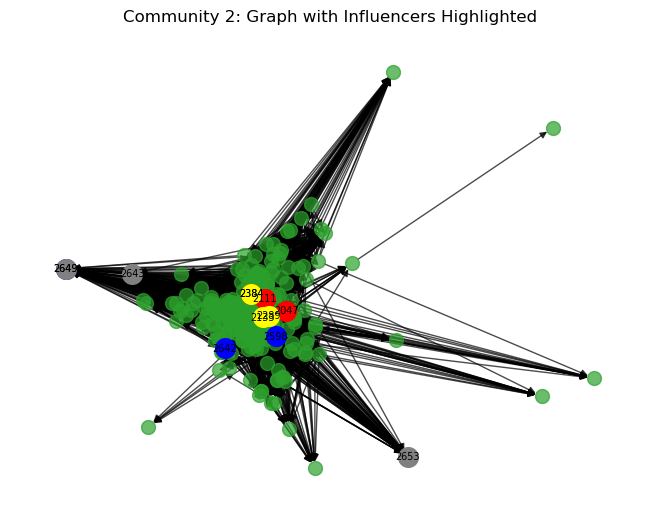

In [49]:
def graphing():
    pos = nx.spring_layout(G, seed=5656)
    communities = comm_with_max_count[:3]
    
    colors = [f'C{i}' for i in range(len(communities))]  # Assign unique color to each community

    for i, community in enumerate(communities):
        selected_data = {n: d['community'] for n, d in G.nodes(data=True) if d['community'] == community}
        sg = G.subgraph(list(selected_data.keys()))

        # Identify top influencer nodes based on centrality measures
        degree_top3 = nlargest(3, nx.degree_centrality(sg), key=nx.degree_centrality(sg).get)
        closeness_top3 = nlargest(3, nx.closeness_centrality(sg), key=nx.closeness_centrality(sg).get)
        betweenness_top3 = nlargest(3, nx.betweenness_centrality(sg), key=nx.betweenness_centrality(sg).get)
        eigenvector_top3 = nlargest(3, nx.eigenvector_centrality(sg, max_iter=1000), key=nx.eigenvector_centrality(sg, max_iter=1000).get)

        plt.figure()
        nx.draw(sg, pos, node_color=colors[i], node_size=100, alpha=0.7, with_labels=False)
        nx.draw_networkx_nodes(sg, pos, nodelist=degree_top3, node_color='red', node_size=200)
        nx.draw_networkx_nodes(sg, pos, nodelist=closeness_top3, node_color='blue', node_size=200)
        nx.draw_networkx_nodes(sg, pos, nodelist=betweenness_top3, node_color='yellow', node_size=200)
        nx.draw_networkx_nodes(sg, pos, nodelist=eigenvector_top3, node_color='grey', node_size=200)
        
        nx.draw_networkx_labels(sg, pos, labels={node: node for node in degree_top3}, font_color='black', font_size=7)
        nx.draw_networkx_labels(sg, pos, labels={node: node for node in closeness_top3}, font_color='black', font_size=7)
        nx.draw_networkx_labels(sg, pos, labels={node: node for node in betweenness_top3}, font_color='black', font_size=7)
        nx.draw_networkx_labels(sg, pos, labels={node: node for node in eigenvector_top3}, font_color='black', font_size=7)
        
        
        plt.title(f"Community {community}: Graph with Influencers Highlighted")
        plt.show()

graphing()


# 11)

---------------------

The three largest communities in the graph have been identified and visualized that where the 5, 3 and 2. These communities represent groups of individuals who are closely connected within their respective communities.

- The graph with the top 3 nodes removed based on **Degree Centrality** shows the impact of removing the most highly connected nodes. These nodes have the highest number of connections and are considered important in terms of overall network connectivity.

- The graph with the top 3 nodes removed based on **Closeness Centrality** demonstrates the effect of removing nodes that have the highest closeness centrality. Closeness Centrality measures how quickly information can spread from a node to others, and removing these nodes may disrupt efficient information flow within the network.

- The graph with the top 3 nodes removed based on **Betweenness Centrality** showcases the impact of removing nodes that play a crucial role in the flow of information between different parts of the network. These nodes act as bridges or bottlenecks for communication between other nodes.

- The graph with the top 3 nodes removed based on **Eigenvector Centrality** displays the consequence of removing nodes that have the highest influence and importance based on their connections with other high-scoring nodes. These nodes can have a significant impact on the overall network influence.


if we take hypothetical business to be _Telecom Company_ and lets assume its budget is "$50.000", 
and also assume the cost for marketing relates actions be at least 50 dollar 

The problem that we wat to sove is to improving brand awareness. Soour marketing actions willl be focused on the awwarnes raising. 


As the communites that we identified for the connection txt was 98 it is difficult to give for each a segment without knwing futher information about the costumers. 


Howver as we already defines the largest 3 communities it will be logical to make our action plan the way to setisfy their needs firstly. 

For the community 3 we see that the removal of the top 3 nodes with higeest degree makes them lose connection with some of their coustimers so we should take close attenmtion to them not to lose beacue lossing them will cose us to lose other costomers too. And as they are the ones with highest connection they can also add new customers thus they can enahnce if we satisfy their needs by finding their desired changes they will make the compoy to gain more awarness. 
Understand their needs, preferences, and pain points to develop effective marketing strategies. we should target them. 

Our nest step should be allocating a portion of the marketing budget for targeted advertising campaigns based on the identified influential individuals such as top nodes for degree. Considering the cost per action (advertisement cost) we should determine the number of actions that can be executed within the budget.We can aslo use Multi-channel Campaigns such as designing targeted marketing campaigns utilizing multiple channels, such as social media, email marketing, influencer partnerships, and targeted advertisements. Tailor the campaign messages to resonate with the specific interests and needs of the target individuals. For instance give some influencers discounts and great deal to change their comony to ours and with their advertising tools such connect new costimers. 



Also we should focs on the nodes with eigenvector centreality as they are the once that have potentioal in enlarging or teleocm comapnie's community  


By following this action plan, the telecom company can make efficient use of the marketing budget to target influential individuals within the network and effectively reach the desired target market segments.